<a href="https://colab.research.google.com/github/Badr2211/1000_ML_Engineers_Initiative/blob/main/%20Unsupervised_Learning_Foundation/electropi_recomendation_system_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


## Customer Segmentation for E-commerce Personalization
**Project Overview:** In this project, we will use K-means clustering and PCA to perform customer segmentation based on their purchasing behavior in an e-commerce dataset. The goal is to identify distinct groups of customers with similar preferences and behaviors, enabling personalized marketing strategies and recommendations.
***
## 1-Dataset
- Download the [Online Retail Dataset](https://archive.ics.uci.edu/ml/datasets/online+retail) from the UCI Machine Learning Repository.
- Preprocess the data:
- Handle missing values.
- Clean the data.
- Transform it into a suitable format for analysis.

***
## 2-Feature Engineering
- Extract relevant features from the dataset:
- Purchase history.
- Order frequency.
- Total spending.
- Calculate additional metrics if necessary, such as recency of purchase or average basket size.

***

## 3-Dimensionality Reduction with PCA
- Apply PCA to reduce the dimensionality of the feature space while retaining the most informative features.
- Aim to capture the underlying patterns and structure in the data.
***

## 4-Determining Optimal Number of Clusters
- Use the elbow method or silhouette analysis to determine the optimal number of clusters for K-means.
- Experiment with different values of K and evaluate the clustering results.

***
## 5-K-means Clustering
- Perform K-means clustering on the reduced feature space.
- Assign each customer to a cluster based on their feature values.
- Analyze the resulting clusters and interpret the characteristics of each segment.

***
## 6-Cluster Profiling
- Profile each cluster by calculating cluster-specific metrics, such as average spending, purchase frequency, or popular product categories.
- Identify the key characteristics and behaviors that distinguish each cluster.

***
## 7-Visualization
- Visualize the clusters and their separation using scatter plots or other suitable techniques.
- Plot the clusters based on the reduced feature space to understand the distribution and overlap of customers.

***
## Evaluation
- Evaluate the quality of the clustering results using appropriate metrics such as silhouette score or within-cluster sum of squares (WCSS).
- Assess the cohesion and separation of the clusters to determine the effectiveness of the segmentation.

***
## 8-Personalization and Recommendations
- Based on the identified customer segments, develop personalized marketing strategies and recommendations.
- Tailor promotions, product suggestions, or communication channels for each cluster to enhance customer engagement and satisfaction.


***
## Interpretation and Insights
- Interpret the results and provide insights about the different customer segments.
- Discuss the implications for the e-commerce business, such as targeted marketing, customer retention, or inventory management.
- Remember to adhere to ethical guidelines and data privacy regulations while working with customer data.

#1-Data set

In [ ]:
import seaborn as sns
import pandas as pd
from sklearn.ensemble import IsolationForest
import matplotlib.pyplot as plt
import numpy as np

- Load the data

In [ ]:

# Replace 'your_file.xlsx' with the actual file name
df = pd.read_excel('/content/drive/MyDrive/Online Retail.xlsx')

# Now, 'df' contains your data as a DataFrame

In [ ]:
data=df

In [ ]:
df=data

In [ ]:
df#.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France


## note:

- 'InvoiceNo'
a 6-digit integral number uniquely assigned to each transaction. If this code starts with letter 'c', it indicates a cancellatio

In [ ]:
df['Order_Cancellation']=[1 if i else 0 for i in cancel  ]

In [ ]:
df.shape

(541909, 9)

In [ ]:
def uniq (df):
    df=pd.DataFrame([[i,df[i].unique(),df[i].dtype,len(df[i].unique())]for i in df.columns],columns=['feature','val','types','len']).set_index('feature')
    return df

In [ ]:
uniq (df)

,val,types,len
feature,,,
InvoiceNo,"[536365, 536366, 536367, 536368, 536369, 53637...",object,25900
StockCode,"[85123A, 71053, 84406B, 84029G, 84029E, 22752,...",object,4070
Description,"[WHITE HANGING HEART T-LIGHT HOLDER, WHITE MET...",object,4224
Quantity,"[6, 8, 2, 32, 3, 4, 24, 12, 48, 18, 20, 36, 80...",int64,722
InvoiceDate,"[2010-12-01T08:26:00.000000000, 2010-12-01T08:...",datetime64[ns],23260
UnitPrice,"[2.55, 3.39, 2.75, 7.65, 4.25, 1.85, 1.69, 2.1...",float64,1630
CustomerID,"[17850.0, 13047.0, 12583.0, 13748.0, 15100.0, ...",float64,4373
Country,"[United Kingdom, France, Australia, Netherland...",object,38
Order_Cancellation,"[0, 1]",int64,2


In [ ]:
df['Country'].value_counts()[18:-15]

Denmark    389
Japan      358
Poland     341
Israel     297
USA        291
Name: Country, dtype: int64


***
***
There is no Country called israel
- Must handel it
***
***

In [ ]:
#
df['Country'] = df['Country'].replace({'Israel': 'Palestine'})
#df.loc[df['Country'] == 'Israel', 'Country'] = 'Palestine'

In [ ]:
df['Country'].isin(['Israel']).sum()

0

In [ ]:
df['Country'].value_counts()[18:-15]

Denmark      389
Japan        358
Poland       341
Palestine    297
USA          291
Name: Country, dtype: int64

In [ ]:
print(df.isnull().sum())

InvoiceNo                  0
StockCode                  0
Description             1454
Quantity                   0
InvoiceDate                0
UnitPrice                  0
CustomerID            135080
Country                    0
Order_Cancellation         0
dtype: int64


CustomerID' is crucial for my analysis, and rows with null 'CustomerID' values cannot be imputed or filled in any meaningful way

In [ ]:
df.dropna(subset=['CustomerID'],inplace=True)

In [ ]:
print(df.isnull().sum())

InvoiceNo             0
StockCode             0
Description           0
Quantity              0
InvoiceDate           0
UnitPrice             0
CustomerID            0
Country               0
Order_Cancellation    0
dtype: int64


In [ ]:
cancel= df['InvoiceNo'].str.contains('c', case=False, na=False)
cancel.sum()
cancel_transaction=df[cancel]
cancel_transaction

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Order_Cancellation
141,C536379,D,Discount,-1,2010-12-01 09:41:00,27.50,14527.0,United Kingdom,1
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,2010-12-01 09:49:00,4.65,15311.0,United Kingdom,1
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,2010-12-01 10:24:00,1.65,17548.0,United Kingdom,1
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.0,United Kingdom,1
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.0,United Kingdom,1
...,...,...,...,...,...,...,...,...,...
540449,C581490,23144,ZINC T-LIGHT HOLDER STARS SMALL,-11,2011-12-09 09:57:00,0.83,14397.0,United Kingdom,1
541541,C581499,M,Manual,-1,2011-12-09 10:28:00,224.69,15498.0,United Kingdom,1
541715,C581568,21258,VICTORIAN SEWING BOX LARGE,-5,2011-12-09 11:57:00,10.95,15311.0,United Kingdom,1
541716,C581569,84978,HANGING HEART JAR T-LIGHT HOLDER,-1,2011-12-09 11:58:00,1.25,17315.0,United Kingdom,1


In [ ]:
df.shape

(406829, 9)

***
## 2-Feature Engineering:

- Extract relevant features from the dataset, such as:
-Total spending per customer.Order frequen(e.g., how often each customer makes a purchase).
-
Recency of purchase (e.g., days since the last purchase).

- Average basket size (e.g., average number of items per transaction).

- Any other meaningful customer behavior metrics.

# Note:
-   I've named dataframe as customer_behavior, which will eventually contain all the customer-based features we plan to create.

In [ ]:

customer_behavior=df.groupby('CustomerID',as_index=False)['Description'].agg(lambda x: x.mode().iloc[0])

***
- keep in mind the cancel transecation

In [ ]:

df['Total_spending'] = np.where(cancel == False, df['UnitPrice'] * df['Quantity'], 0)



# Calculate Total Spending per Customer
customer_behavior ['Total_spending']= df.groupby(['CustomerID']) ['Total_spending'] .sum().values#.reset_index()

In [ ]:

df['Quantity'] = np.where(cancel == False, df['Quantity'], 0)


customer_behavior ['total_products_purchased']= df.groupby(['CustomerID']) ['Quantity'] .sum().values#.reset_index()

In [ ]:

customer_behavior['N.Order_Cancellation']=df.groupby('CustomerID')['Order_Cancellation'].sum().values

In [ ]:

df['sucsess_transaction']=np.where(cancel == False, 1, 0)

customer_behavior['N.transaction'] =df.groupby('CustomerID')['sucsess_transaction'].sum().values

***

In [ ]:


# Convert InvoiceDate to datetime and extract only the date
df['Day'] = df['InvoiceDate'].dt.date

# Find the most recent purchase date for each customer
customer_behavior['Day'] = df.groupby('CustomerID')['Day'].max().values

# Find the most recent date in the entire dataset
most_recent_date = df['Day'].max()

# Convert InvoiceDay to datetime type before subtraction
customer_behavior['Day'] = pd.to_datetime(customer_behavior['Day'])
most_recent_date = pd.to_datetime(most_recent_date)

# Calculate the number of days since the last purchase for each customer
customer_behavior['Days_Since_Last_Purchase'] = (most_recent_date - customer_behavior['Day']).dt.days

# Remove the InvoiceDay column
customer_behavior.drop(columns=['Day'], inplace=True)

In [ ]:
df['Year'] = df['InvoiceDate'].dt.year
df['Month'] = df['InvoiceDate'].dt.month

In [ ]:

customer_behavior['Month']=df.groupby('CustomerID')['Month'].agg(lambda x: x.mode().iloc[0]).values

In [ ]:

# Create columns for start and end dates of customer transactions
customer_behavior['start_date'] = df.groupby(['CustomerID'])['InvoiceDate'].min().values
customer_behavior['end_date'] = df.groupby(['CustomerID'])['InvoiceDate'].max().values

# Calculate the duration of customer transactions
customer_behavior['N.day_as_customer'] = (customer_behavior['end_date'] - customer_behavior['start_date']).dt.days

#drop star and end
customer_behavior.drop(columns=['start_date','end_date'], inplace=True)

# Capture the country associated with each customer
customer_behavior['Country'] = df.groupby(['CustomerID'])['Country'].min().values
customer_behavior['UK'] = [1 if country == 'United Kingdom' else 0 for country in customer_behavior['Country']]
customer_behavior.drop(columns=['Country'], inplace=True)


# Calculate the average basket size for each customer
customer_behavior['Average Basket Size'] = df.groupby(['CustomerID'])['Quantity'].mean().values.astype(int)

# Calculate the total number of products purchased by each customer
#customer_behavior['total_products_purchased'] = df.groupby('CustomerID')['Quantity'].sum().values


customer_behavior['Average_Transaction_Value'] = customer_behavior['Total_spending'] / (customer_behavior['N.transaction'] +1) # +1 to avoid divide by 0

# customer_behavior['ratio_of_transaction_per_day'] = customer_behavior['Quantity'] / customer_behavior['duration'].astype(int)

customer_behavior['unique_products'] = df.groupby('CustomerID')['StockCode'].nunique().values


# Calculate the frequency of shopping on specific days of the week
customer_behavior['shopping_day'] = df.groupby(['CustomerID', df['InvoiceDate'].dt.dayofweek])['InvoiceNo'].nunique().unstack(fill_value=0).idxmax(axis=1).values

abandoned_cart_customers = df[df['Description'].isnull()]['CustomerID'].unique()
customer_behavior['cart_abandonment_rate'] = customer_behavior.index.isin(abandoned_cart_customers).astype(int)

customer_behavior.head(10)

,CustomerID,Description,Total_spending,total_products_purchased,N.Order_Cancellation,N.transaction,Days_Since_Last_Purchase,Month,N.day_as_customer,UK,Average Basket Size,Average_Transaction_Value,unique_products,shopping_day,cart_abandonment_rate
0,12346.0,MEDIUM CERAMIC TOP STORAGE JAR,77183.60,74215,1,1,325,1,0,1,37107,38591.800000,1,1,0
1,12347.0,AIRLINE BAG VINTAGE JET SET BROWN,4310.00,2458,0,182,2,10,365,0,13,23.551913,103,1,0
2,12348.0,POSTAGE,1797.24,2341,0,31,75,12,282,0,75,56.163750,22,1,0
3,12349.0,16 PIECE CUTLERY SET PANTRY DESIGN,1757.55,631,0,73,18,11,0,0,8,23.750676,73,0,0
4,12350.0,4 TRADITIONAL SPINNING TOPS,334.40,197,0,17,310,2,0,0,11,18.577778,17,2,0
5,12352.0,Manual,2506.04,536,10,85,36,3,260,0,5,29.140000,59,1,0
6,12353.0,CERAMIC CAKE BOWL + HANGING CAKES,89.00,20,0,4,204,5,0,0,5,17.800000,4,3,0
7,12354.0,3 TIER CAKE TIN GREEN AND CREAM,1079.40,530,0,58,232,4,0,0,9,18.294915,58,3,0
8,12355.0,DOUGHNUT LIP GLOSS,459.40,240,0,13,214,5,0,0,18,32.814286,13,0,0
9,12356.0,RED RETROSPOT CAKE STAND,2811.43,1591,0,59,22,1,302,0,26,46.857167,53,1,0


## Outliers

***
as we can see :
our data is has more sample as outliers

In [ ]:
desc=customer_behavior.describe()
#desc

In [ ]:

model = IsolationForest(contamination=0.05, random_state=0)

# Fitting the model on our dataset (converting DataFrame to NumPy to avoid warning)
customer_behavior['Outlier_Scores'] = model.fit_predict(customer_behavior.iloc[:, 2:].to_numpy())

# Creating a new column to identify outliers (1 for inliers and -1 for outliers)
customer_behavior['Is_Outlier'] = [1 if x == -1 else 0 for x in customer_behavior['Outlier_Scores']]

# Display the first few rows of the customer_data dataframe
customer_behavior.head()

,CustomerID,Description,Total_spending,total_products_purchased,N.Order_Cancellation,N.transaction,Days_Since_Last_Purchase,Month,N.day_as_customer,UK,Average Basket Size,Average_Transaction_Value,unique_products,shopping_day,cart_abandonment_rate,Outlier_Scores,Is_Outlier
0,12346.0,MEDIUM CERAMIC TOP STORAGE JAR,77183.60,74215,1,1,325,1,0,1,37107,38591.800000,1,1,0,-1,1
1,12347.0,AIRLINE BAG VINTAGE JET SET BROWN,4310.00,2458,0,182,2,10,365,0,13,23.551913,103,1,0,1,0
2,12348.0,POSTAGE,1797.24,2341,0,31,75,12,282,0,75,56.163750,22,1,0,1,0
3,12349.0,16 PIECE CUTLERY SET PANTRY DESIGN,1757.55,631,0,73,18,11,0,0,8,23.750676,73,0,0,1,0
4,12350.0,4 TRADITIONAL SPINNING TOPS,334.40,197,0,17,310,2,0,0,11,18.577778,17,2,0,1,0


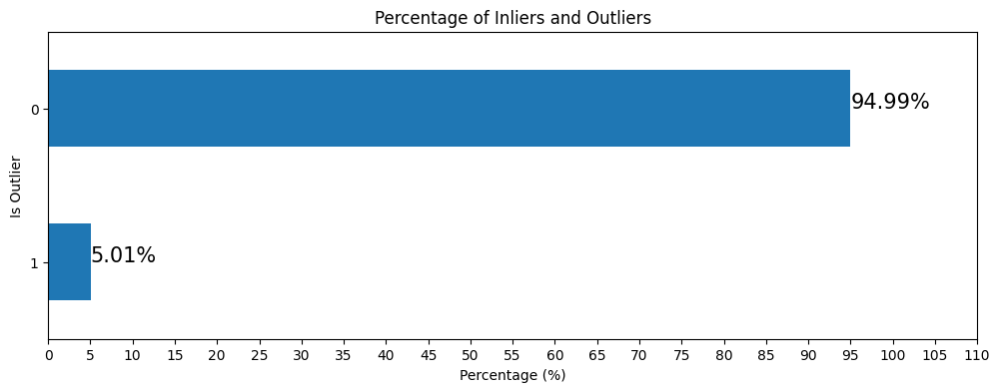

In [ ]:


outlier_percentage = customer_behavior['Is_Outlier'].value_counts(normalize=True) * 100

# Plotting the percentage of inliers and outliers
plt.figure(figsize=(12, 4))
outlier_percentage.plot(kind='barh')

# Adding the percentage labels on the bars
for index, value in enumerate(outlier_percentage):
    plt.text(value, index, f'{value:.2f}%', fontsize=15)

plt.title('Percentage of Inliers and Outliers')
plt.xticks(ticks=np.arange(0, 115, 5))
plt.xlabel('Percentage (%)')
plt.ylabel('Is Outlier')
plt.gca().invert_yaxis()
plt.show()

In [ ]:
#Remove the outliers from the main dataset
customer_behavior = customer_behavior[customer_behavior['Is_Outlier'] == 0]

# Drop the 'Outlier_Scores' and 'Is_Outlier' columns
customer_behavior = customer_behavior.drop(columns=['Outlier_Scores', 'Is_Outlier'])

In [ ]:
desc.loc['max':,:]

,CustomerID,Total_spending,total_products_purchased,N.Order_Cancellation,N.transaction,Days_Since_Last_Purchase,Month,N.day_as_customer,UK,Average Basket Size,Average_Transaction_Value,unique_products,shopping_day,cart_abandonment_rate
max,18287.0,280206.02,197491.0,226.0,7847.0,373.0,12.0,373.0,1.0,37107.0,42118.125,1794.0,6.0,0.0


- you can comapare and note that
now data isnt has outliers

In [ ]:
after=customer_behavior.describe()
after.loc['max':,:]

,CustomerID,Total_spending,total_products_purchased,N.Order_Cancellation,N.transaction,Days_Since_Last_Purchase,Month,N.day_as_customer,UK,Average Basket Size,Average_Transaction_Value,unique_products,shopping_day,cart_abandonment_rate
max,18287.0,15610.39,10159.0,46.0,981.0,373.0,12.0,372.0,1.0,1440.0,1016.55,445.0,6.0,0.0


#EDA for our new feature
***

<ipython-input-45-bc5c35ea7923>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr=customer_behavior.corr()


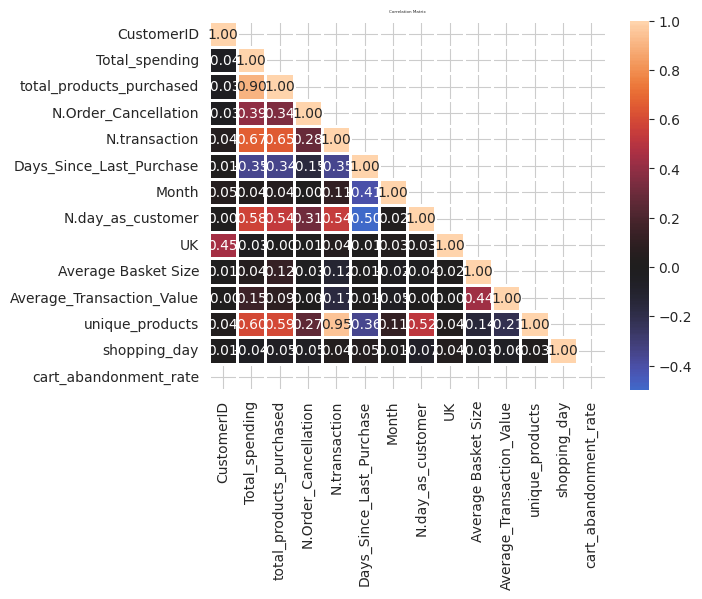

In [ ]:

sns.set_style('whitegrid')
corr=customer_behavior.corr()

mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask, k=1)] = True
sns.heatmap(corr,mask=mask,annot=True,center=0, fmt='.2f', linewidths=2)
plt.title('Correlation Matrix', fontsize=3)
plt.show()

In [ ]:
uniq(customer_behavior)

,val,types,len
feature,,,
CustomerID,"[12347.0, 12348.0, 12349.0, 12350.0, 12352.0, ...",float64,4153
Description,"[AIRLINE BAG VINTAGE JET SET BROWN, POSTAGE, 1...",object,1162
Total_spending,"[4310.0, 1797.24, 1757.55, 334.4, 2506.04, 89....",float64,4041
total_products_purchased,"[2458, 2341, 631, 197, 536, 20, 530, 240, 1591...",int64,1587
N.Order_Cancellation,"[0, 10, 6, 8, 1, 4, 3, 2, 5, 11, 7, 30, 9, 17,...",int64,36
N.transaction,"[182, 31, 73, 17, 85, 4, 58, 13, 59, 19, 248, ...",int64,380
Days_Since_Last_Purchase,"[2, 75, 18, 310, 36, 204, 232, 214, 22, 1, 7, ...",int64,304
Month,"[10, 12, 11, 2, 3, 5, 4, 1, 7, 8, 9, 6]",int64,12
N.day_as_customer,"[365, 282, 0, 260, 302, 149, 323, 148, 292, 13...",int64,373


## note:
***
- In the United Kingdom (UK), the convention for starting the week is with "Monday" as the first day of the week

- Saturday is rest day
***

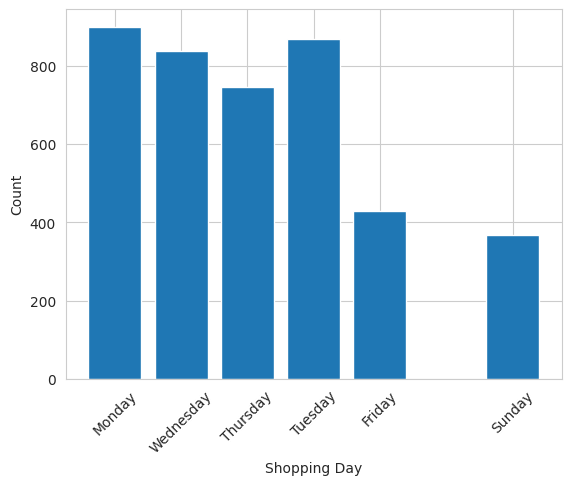

In [ ]:

shopping_day_counts = customer_behavior['shopping_day'].value_counts()
plt.bar(shopping_day_counts.index, shopping_day_counts.values)

# Set custom x-labels
custom_labels = ['Monday', 'Tuesday', 'Wednesday', 'Thursday',  'Friday', 'Sunday']
plt.xticks(shopping_day_counts.index, custom_labels, rotation=45)  # Rotate labels for readability

# Label the axes
plt.xlabel('Shopping Day')
plt.ylabel('Count')

# Show the plot
plt.show()

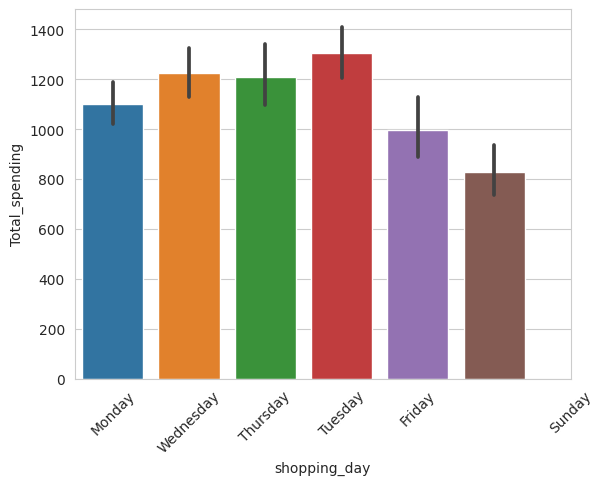

In [ ]:
sns .barplot(x='shopping_day',y='Total_spending',data=customer_behavior)
plt.xticks(shopping_day_counts.index,custom_labels,rotation=45)
plt.show()

- we have hight income in $Tuseday$
- and low income in $Sunday$

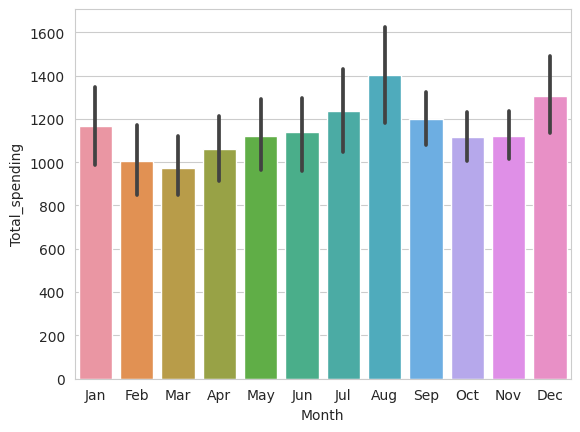

In [ ]:
sns .barplot(x='Month',y='Total_spending',data=customer_behavior)
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.gca().set_xticklabels(month_names)
#plt.xticks( rotation=45)
plt.show()

- we have hight income in  $Aug$
- and low income in $Feb$ and  $Mar$

In [ ]:
customer_behavior['Description'].value_counts()

ASSORTED COLOUR BIRD ORNAMENT         124
POSTAGE                                86
WHITE HANGING HEART T-LIGHT HOLDER     47
BAKING SET 9 PIECE RETROSPOT           47
ANTIQUE SILVER T-LIGHT GLASS           46
                                     ... 
FLAG OF ST GEORGE CHAIR                 1
ASS COL CIRCLE MOBILE                   1
PENS ASSORTED SPACEBALL                 1
PINK FLOWER FABRIC PONY                 1
S/4 IVORY MINI ROSE CANDLE IN BOWL      1
Name: Description, Length: 1162, dtype: int64

Max of Total_spending= 280206.02


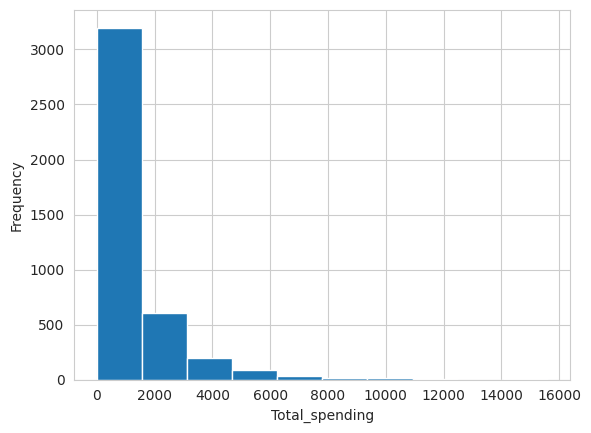

Max of total_products_purchased= 197491.0


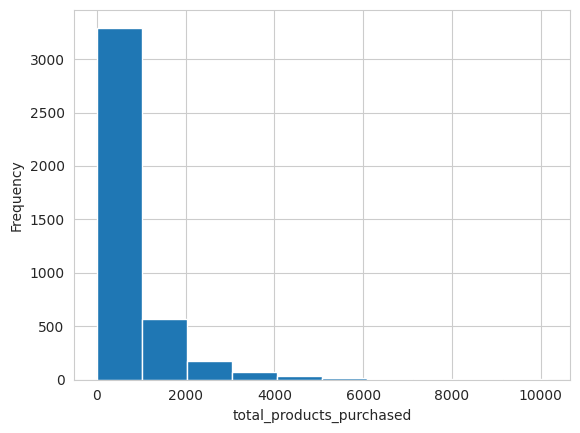

Max of N.Order_Cancellation= 226.0


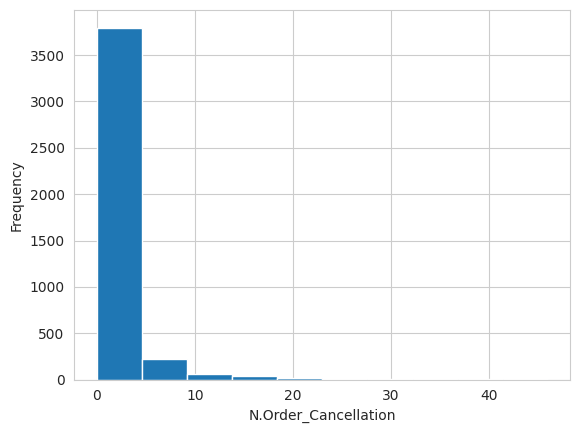

Max of N.transaction= 7847.0


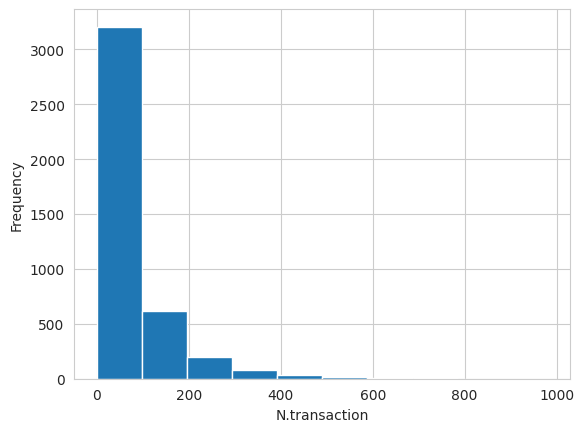

Max of Days_Since_Last_Purchase= 373.0


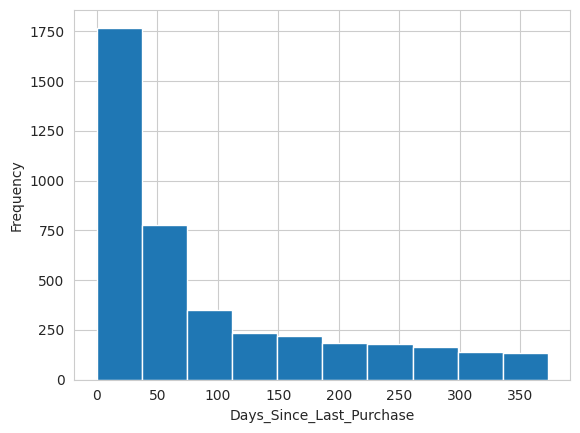

Max of Month= 12.0


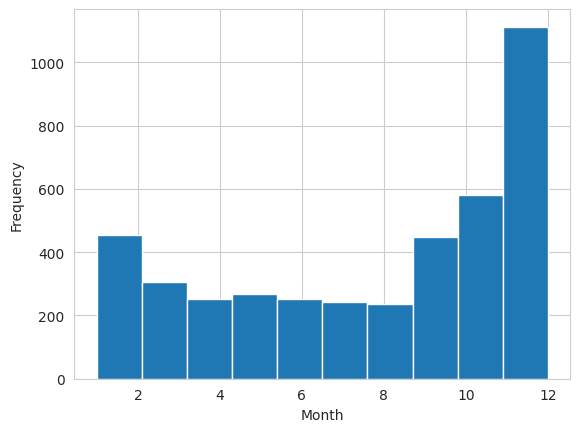

Max of N.day_as_customer= 373.0


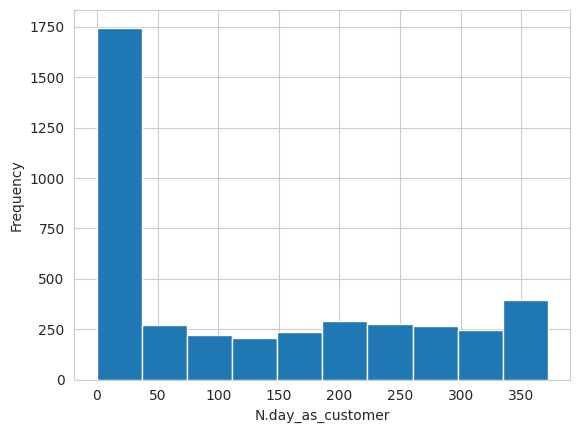

Max of UK= 1.0


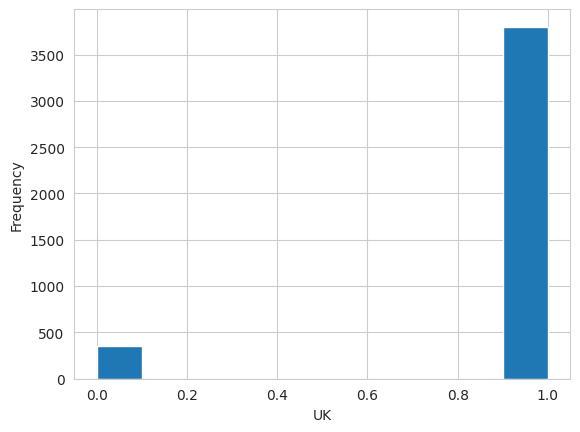

Max of Average Basket Size= 37107.0


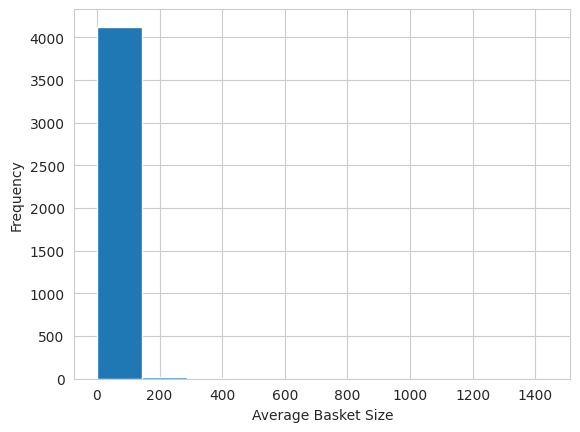

Max of Average_Transaction_Value= 42118.125


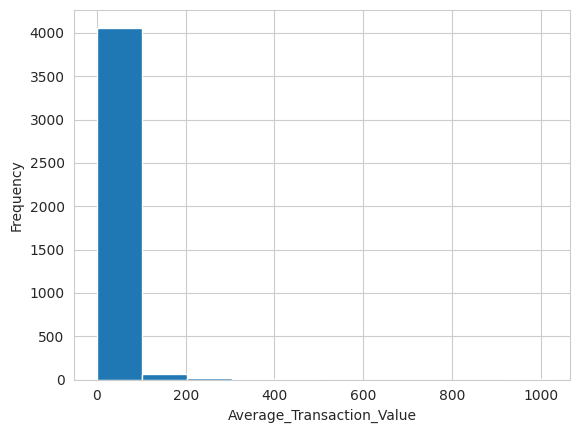

Max of unique_products= 1794.0


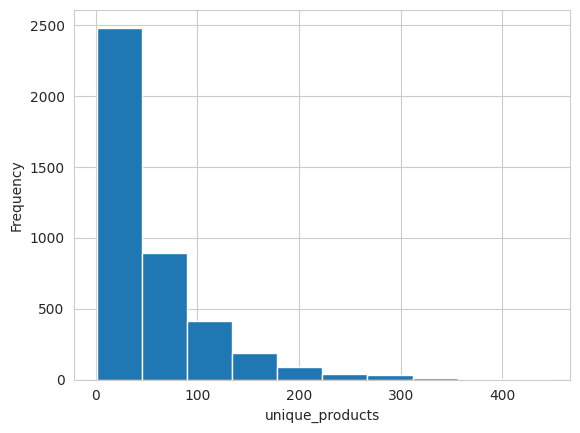

Max of shopping_day= 6.0


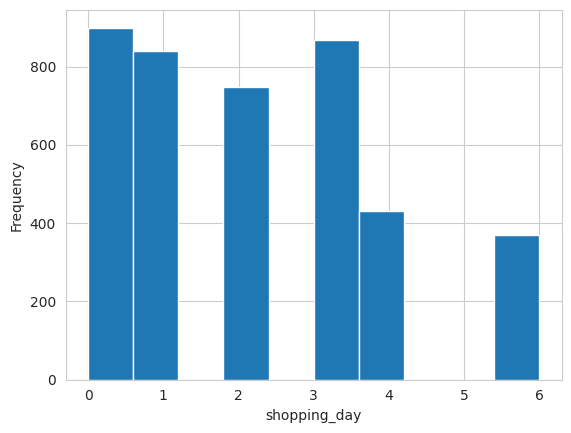

Max of cart_abandonment_rate= 0.0


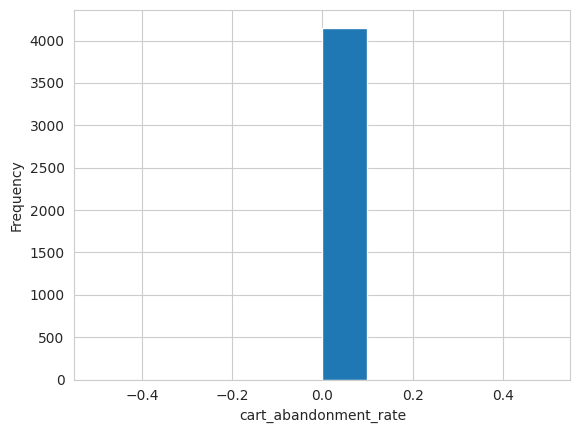

In [ ]:
import matplotlib.pyplot as plt

for i in customer_behavior.columns[2:]:#[ 'Total_spending', 'order_frequency', 'Average Basket Size','total_products_purchased']:

    customer_behavior[i].plot.hist()#range=(0,desc.loc['75%',i])) #1661 is 3d quantire

    plt.xlabel(i)
    print(f'Max of {i}=',desc.loc['max',i])
    plt.show()

#PCA
***

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [ ]:

scaler = StandardScaler()
customer_behavior_scaled = scaler.fit_transform(customer_behavior.iloc[:,2:])
customer_behavior_scaled = pd.DataFrame(customer_behavior_scaled, columns=[f'{c}' for c in customer_behavior.columns[2:]])

customer_behavior_scaled.head()

,Total_spending,total_products_purchased,N.Order_Cancellation,N.transaction,Days_Since_Last_Purchase,Month,N.day_as_customer,UK,Average Basket Size,Average_Transaction_Value,unique_products,shopping_day,cart_abandonment_rate
0,2.179023,1.987637,-0.386321,1.254271,-0.908677,0.692484,1.837659,-3.280987,-0.018468,0.022574,0.886650,-0.645737,0.0
1,0.444292,1.856820,-0.386321,-0.446742,-0.184624,1.269623,1.197290,-3.280987,1.900469,1.026856,-0.559788,-0.645737,0.0
2,0.416891,-0.055116,-0.386321,0.026387,-0.749980,0.981053,-0.978420,-3.280987,-0.173220,0.028695,0.350932,-1.214144,0.0
3,-0.565607,-0.540368,-0.386321,-0.604452,2.146232,-1.616073,-0.978420,-3.280987,-0.080369,-0.130605,-0.649075,-0.077330,0.0
4,0.933625,-0.161335,2.445790,0.161567,-0.571447,-1.327503,1.027554,-3.280987,-0.266072,0.194659,0.100930,-0.645737,0.0


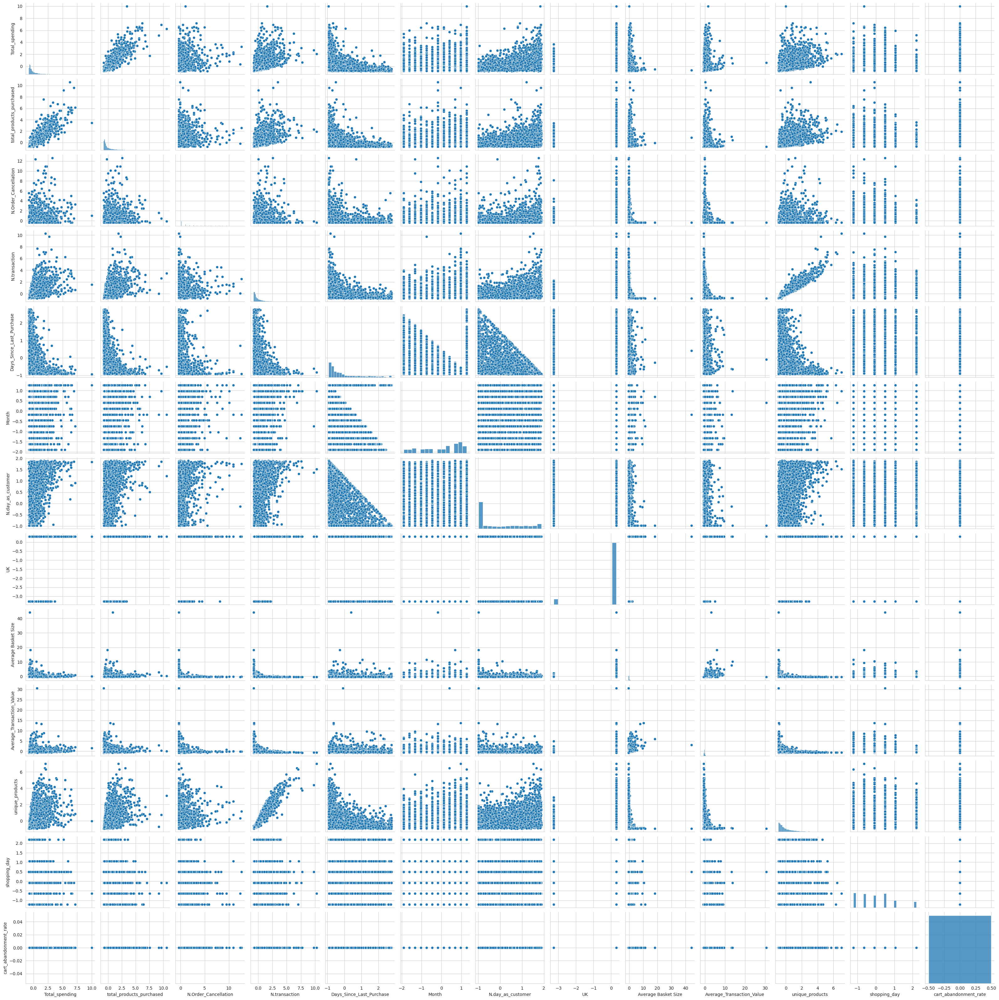

In [ ]:
sns.pairplot(customer_behavior_scaled)
plt.show()

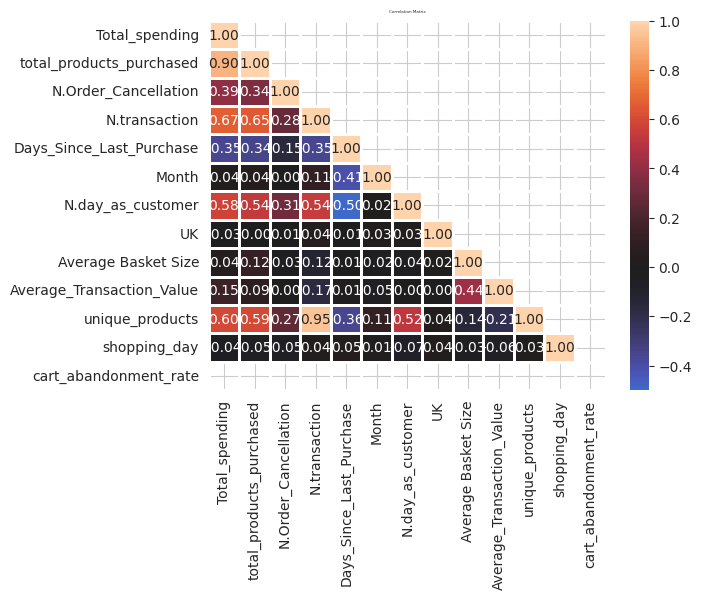

In [ ]:

#customer_behavior.corr().style.background_gradient(cmap='coolwarm')


sns.set_style('whitegrid')
corr=customer_behavior_scaled.corr()

mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask, k=1)] = True
sns.heatmap(corr,mask=mask,annot=True,center=0, fmt='.2f', linewidths=2)
plt.title('Correlation Matrix', fontsize=3)
plt.show()

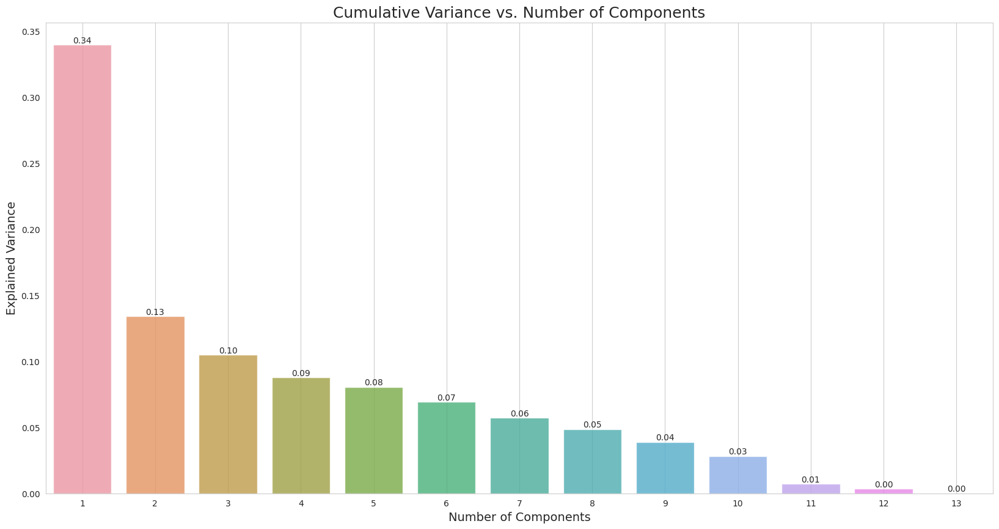

In [ ]:
#Setting CustomerID as the index column
#customer_behaviorset_index('CustomerID', inplace=True)

# Apply PCA
pca = PCA().fit(customer_behavior_scaled)

# Calculate the Cumulative Sum of the Explained Variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Set the optimal k value (based on our analysis, we can choose 6)
optimal_k = 6

# Set seaborn plot style

# Plot the cumulative explained variance against the number of components
plt.figure(figsize=(20, 10))

# Bar chart for the explained variance of each component
barplot = sns.barplot(x=list(range(1, len(cumulative_explained_variance) + 1)),
                      y=explained_variance_ratio,
                      alpha=0.8)



# Set labels and title
plt.xlabel('Number of Components', fontsize=14)
plt.ylabel('Explained Variance', fontsize=14)
plt.title('Cumulative Variance vs. Number of Components', fontsize=18)


# Display the variance values for both graphs on the plots
x_offset = -0.3
y_offset = 0.01
for i, ev_ratio in enumerate(explained_variance_ratio):
    plt.text(i, ev_ratio, f"{ev_ratio:.2f}", ha="center", va="bottom", fontsize=10)
plt.grid(axis='both')
plt.show()

- As we can see ```5```th has the most importance

In [ ]:

# Set the optimal k value (based on our analysis, we can choose 6)
optimal_k = 5
pca = PCA(n_components=optimal_k)#n_components=3
pca.fit(customer_behavior_scaled)

PCA(n_components=5)

In [ ]:
Xhat = pca.transform(customer_behavior_scaled)

customer_behavior_PCA = pd.DataFrame(columns=[f'Projection on Component {i+1}' for i in range(optimal_k)], data=Xhat)
customer_behavior_PCA.index= customer_behavior.index
customer_behavior_PCA

,Projection on Component 1,Projection on Component 2,Projection on Component 3,Projection on Component 4,Projection on Component 5
1,3.555872,0.570588,0.176517,-2.472723,2.405469
2,0.948048,2.489229,1.094648,-2.242680,2.464077
3,0.135366,-0.050716,0.849046,-2.892114,2.038373
4,-2.215733,0.217141,-2.458011,-1.988074,2.263588
5,1.411513,0.662963,-1.483904,-3.070345,1.422973
...,...,...,...,...,...
4367,-2.232135,0.044438,-1.647579,-0.568892,-1.120374
4368,-2.018967,-0.703134,-0.621964,1.680896,0.990802
4369,-0.962364,-0.548860,0.797934,0.629356,0.266573
4370,6.388474,-2.558688,-0.095166,1.590323,0.718906


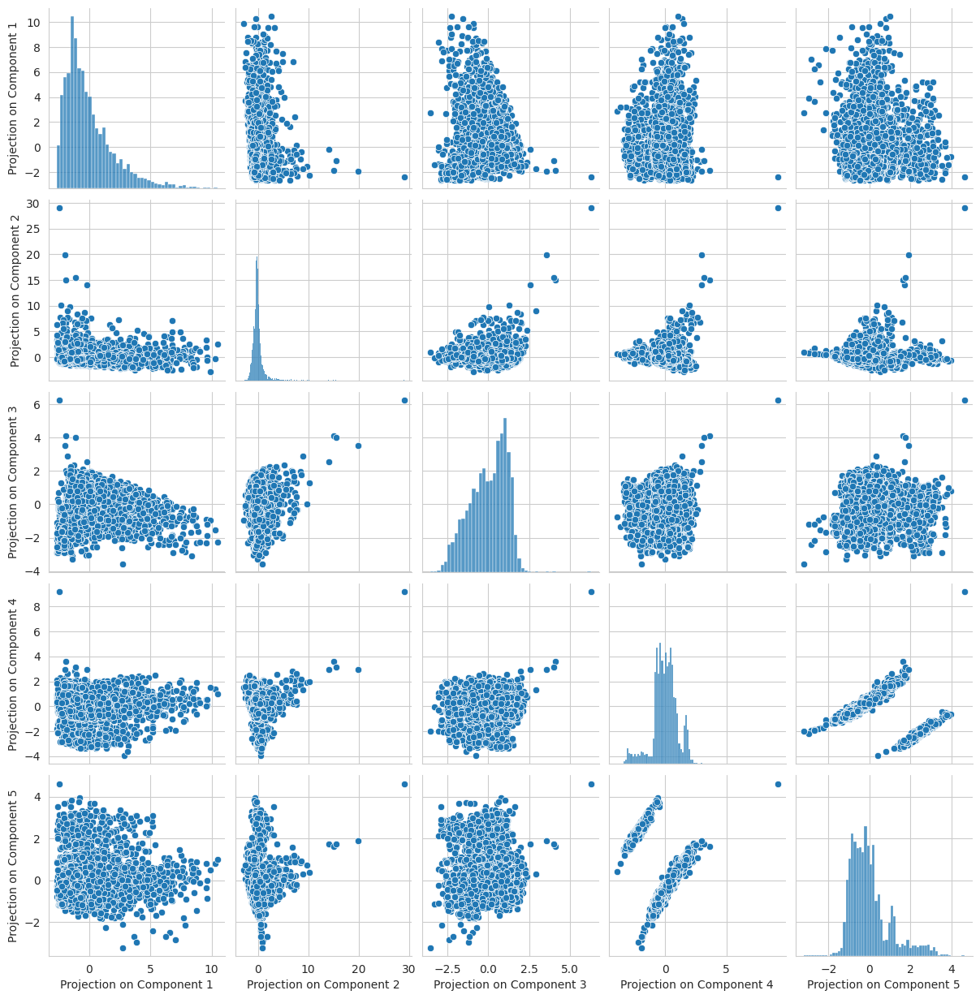

In [ ]:
sns.pairplot(customer_behavior_PCA)
plt.show()

In [ ]:
customer_behavior_PCA#columns

,Projection on Component 1,Projection on Component 2,Projection on Component 3,Projection on Component 4,Projection on Component 5
1,3.555872,0.570588,0.176517,-2.472723,2.405469
2,0.948048,2.489229,1.094648,-2.242680,2.464077
3,0.135366,-0.050716,0.849046,-2.892114,2.038373
4,-2.215733,0.217141,-2.458011,-1.988074,2.263588
5,1.411513,0.662963,-1.483904,-3.070345,1.422973
...,...,...,...,...,...
4367,-2.232135,0.044438,-1.647579,-0.568892,-1.120374
4368,-2.018967,-0.703134,-0.621964,1.680896,0.990802
4369,-0.962364,-0.548860,0.797934,0.629356,0.266573
4370,6.388474,-2.558688,-0.095166,1.590323,0.718906


In [ ]:

# Create the PCA component DataFrame
pc_df = pd.DataFrame(pca.components_.T, columns=['PC{}'.format(i+1) for i in range(pca.n_components_)],
                     index=customer_behavior_scaled.columns)

pc_df.style.background_gradient(cmap='coolwarm')

,PC1,PC2,PC3,PC4,PC5
Total_spending,0.428860,0.204135,-0.124572,-0.007201,0.064491
total_products_purchased,0.419344,0.203664,-0.109018,0.022673,0.055804
N.Order_Cancellation,0.229921,0.073742,-0.173485,-0.143168,-0.201754
N.transaction,0.434197,-0.159299,-0.106700,0.122408,0.057440
Days_Since_Last_Purchase,-0.276864,0.034718,-0.563495,0.105331,-0.018883
Month,0.081164,-0.148236,0.750645,0.002561,0.085150
N.day_as_customer,0.370606,0.038683,0.030690,-0.079497,-0.102535
UK,0.012555,-0.027386,0.093555,0.644438,-0.749121
Average Basket Size,-0.024570,0.606167,0.138735,0.189854,0.097840
Average_Transaction_Value,-0.024490,0.655066,0.098903,0.084322,0.057029


In [ ]:
customer_behavior_PCA.corr().style.background_gradient(cmap='coolwarm')

,Projection on Component 1,Projection on Component 2,Projection on Component 3,Projection on Component 4,Projection on Component 5
Projection on Component 1,1.000000,0.000000,-0.000000,0.000000,-0.000000
Projection on Component 2,0.000000,1.000000,-0.000000,0.000000,0.000000
Projection on Component 3,-0.000000,-0.000000,1.000000,-0.000000,0.000000
Projection on Component 4,0.000000,0.000000,-0.000000,1.000000,-0.000000
Projection on Component 5,-0.000000,0.000000,0.000000,-0.000000,1.000000




***
As you can see, the correlations of the ```5``` principal components are now zero, meaning we have successfully de-correlated  and obtained features that are linearly independent of each other.

***

#4-Determining Optimal Number of Clusters
***

In [ ]:
from sklearn.cluster import KMeans# Create and fit a range of models
km_list = list()

for clust in range(1,21):
    km = KMeans(n_clusters=clust, random_state=42)
    km = km.fit(customer_behavior_PCA)

    km_list.append(pd.Series({'clusters': clust,
                              'inertia': km.inertia_,
                              'model': km}))

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

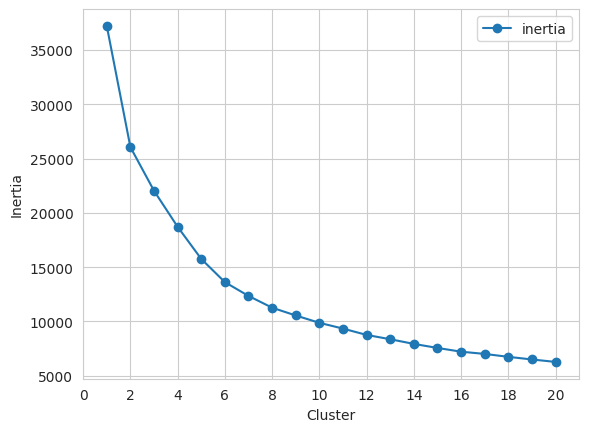

In [ ]:
plot_data = (pd.concat(km_list, axis=1)
             .T
             [['clusters','inertia']]
             .set_index('clusters'))

ax = plot_data.plot(marker='o',ls='-')
ax.set_xticks(range(0,21,2))
ax.set_xlim(0,21)
ax.set(xlabel='Cluster', ylabel='Inertia');

In [ ]:
from sklearn.metrics import silhouette_score
silhouette_score(customer_behavior_PCA, km.labels_)

0.24770664735444214

In [ ]:
kmeans_per_k = [KMeans(n_clusters=k, init='k-means++',random_state=42).fit(customer_behavior_PCA)
                for k in range(1, 10)]

silhouette_scores = [silhouette_score(customer_behavior_PCA, model.labels_)
                     for model in kmeans_per_k[1:]]

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

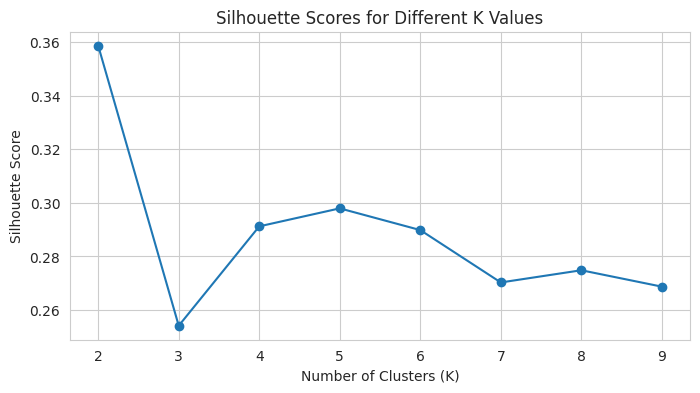

In [ ]:

plt.figure(figsize=(8, 4))
plt.plot(range(2, 10), silhouette_scores, marker='o')
plt.title('Silhouette Scores for Different K Values')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

***
As we can see, ``` k=2 ``` is a very good choice, but it also underlines the fact that  $k=5,4,6$  is quite good as well.
***

<ipython-input-68-cb0d633fba66>:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color = plt.cm.get_cmap("Spectral")(float(i) / n_clusters)
<ipython-input-68-cb0d633fba66>:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color = plt.cm.get_cmap("Spectral")(float(i) / n_clusters)
<ipython-input-68-cb0d633fba66>:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color = plt.cm.get_cmap("Spectral")(float(i) / n_clusters)
<ipython-input-68-cb0d633fba66>:24: MatplotlibDeprecationW

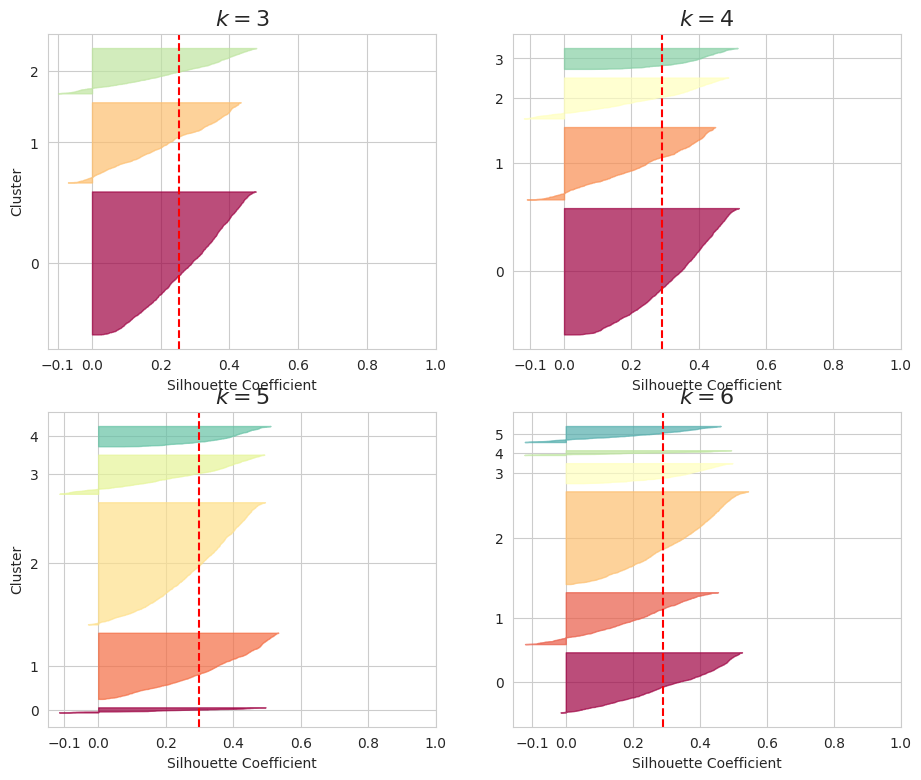

In [ ]:
from sklearn.metrics import silhouette_samples
from matplotlib.ticker import FixedLocator, FixedFormatter

plt.figure(figsize=(11, 9))

for k in (3,  4,5,6):


    plt.subplot(2, 2, k-2)

    y_pred = kmeans_per_k[k - 1].labels_
    silhouette_coefficients = silhouette_samples(customer_behavior_PCA,y_pred)

    n_clusters = k
    padding = len(customer_behavior_PCA) // 30
    pos = padding
    ticks = []
    for i in range(k):
        coeffs = silhouette_coefficients[y_pred == i]
        coeffs.sort()


        #color = mpl.cm.Spectral(i / k)
        color = plt.cm.get_cmap("Spectral")(float(i) / n_clusters)
        plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                          facecolor=color,edgecolor=color, alpha=0.7)
        ticks.append(pos + len(coeffs) // 2)
        pos += len(coeffs) + padding

    plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
    plt.gca().yaxis.set_major_formatter(FixedFormatter(range(k)))
    if k in (3, 5):
        plt.ylabel("Cluster")

    if True:
        plt.gca().set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
        plt.xlabel("Silhouette Coefficient")
    else:
        plt.tick_params(labelbottom=False)

    plt.axvline(x=silhouette_scores[k - 2], color="red", linestyle="--")
    plt.title("$k={}$".format(k), fontsize=16)

#save_fig("silhouette_analysis_diagram")
plt.show()

***
The silhouette coefficient is a measure of how well each data point is assigned to its cluster. It ranges from -1 to 1, with a higher value indicating a better assignment.
The plot shows that the silhouette coefficient is highest for ``` k = 4 ```. This means that the data is best clustered into 3 clusters.

***

- We can use dendrogram teqnice to see each clusterand determine N.of ```K```

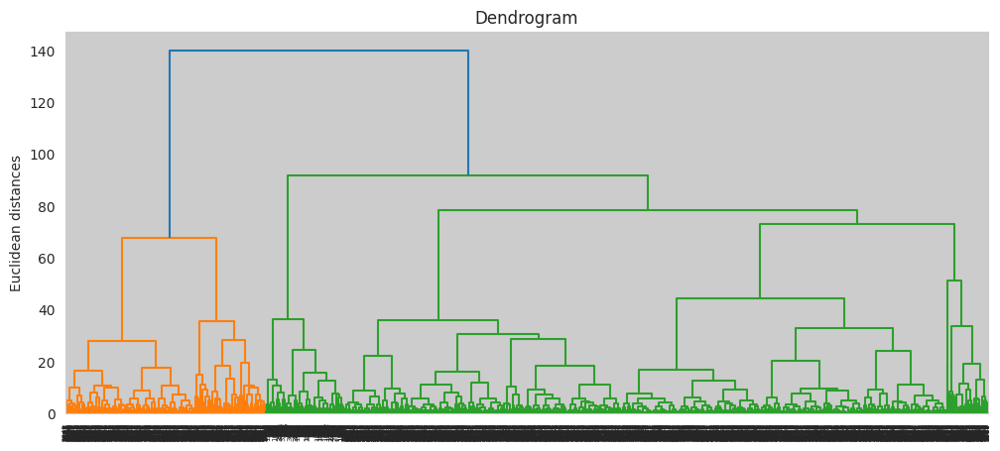

In [ ]:
import scipy.cluster.hierarchy as sch
from matplotlib import pyplot
pyplot.figure(figsize=(12, 5))
dendrogram = sch.dendrogram(sch.linkage(customer_behavior_PCA, method = 'ward'))
plt.title('Dendrogram')
plt.ylabel('Euclidean distances')
plt.show()

***
Based in our analysis i see ```K=4``` is the optimal value for $K$   
***

In [ ]:
optimal_k=4
# Initialize and fit the K-means model
km = KMeans(n_clusters=optimal_k,init='k-means++', random_state=42)
#km = km.fit_predict(customer_behavior_PCA)

cluster_labels = km.fit_predict(customer_behavior_PCA)

# Add the cluster labels as a new column in the DataFrame
customer_behavior['Cluster_Labels'] = cluster_labels

# Now, original_df contains the cluster labels as a new column

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


***
# 6-Cluster Profiling

In [ ]:


clusters_info = customer_behavior.groupby('Cluster_Labels', as_index=False).sum()
clusters_info['N.customer']=customer_behavior['Cluster_Labels'].value_counts().values

clusters_info['sum of cancellation'] =customer_behavior.groupby('Cluster_Labels')['N.Order_Cancellation'].sum().values
cluster_profiling =customer_behavior.groupby('Cluster_Labels', as_index=False).sum()[['Total_spending']]
cluster_profiling ['N.customer']=customer_behavior['Cluster_Labels'].value_counts().values


cluster_profiling['AVG_C_spending'] =cluster_profiling['Total_spending']/cluster_profiling['N.customer']


cluster_profiling ['AVG_C_cancellation']= clusters_info['sum of cancellation']/cluster_profiling['N.customer']

cluster_profiling ['AVG_C_prouduct']=clusters_info['total_products_purchased']/cluster_profiling['N.customer']

cluster_profiling ['AVG_C_prouduct']=clusters_info['total_products_purchased']/cluster_profiling['N.customer']

cluster_profiling ['N.day_as_customer(mode)'] = customer_behavior.groupby('Cluster_Labels')['N.day_as_customer'].agg(lambda x: x.mode().iloc[0]).values


cluster_profiling ['N.day_as_customer(AVG_C)'] = (clusters_info['N.day_as_customer']/cluster_profiling['N.customer']).values.astype(int)

cluster_profiling ['prefer day'] = customer_behavior.groupby('Cluster_Labels')['shopping_day'].agg(lambda x: x.mode().iloc[0]).values


cluster_profiling ['prefer month'] = customer_behavior.groupby('Cluster_Labels')['Month'].agg(lambda x: x.mode().iloc[0]).values


cluster_profiling ['Days_Since_Last_Purchase(mode)'] = customer_behavior.groupby('Cluster_Labels')['Days_Since_Last_Purchase'].agg(lambda x: x.mode().iloc[0]).values


cluster_profiling ['unique_products(mode)']= customer_behavior.groupby('Cluster_Labels')['unique_products'].agg(lambda x: x.mode().iloc[0]).values

cluster_profiling.insert(0, 'Cluster_Labels', [0,1,2,3])

<ipython-input-184-e7e7781688e1>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  clusters_info = customer_behavior.groupby('Cluster_Labels', as_index=False).sum()
<ipython-input-184-e7e7781688e1>:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  cluster_profiling =customer_behavior.groupby('Cluster_Labels', as_index=False).sum()[['Total_spending']]


In [ ]:
cluster_profiling

,Cluster_Labels,Total_spending,N.customer,AVG_C_spending,AVG_C_cancellation,AVG_C_prouduct,N.day_as_customer(mode),N.day_as_customer(AVG_C),prefer day,prefer month,Days_Since_Last_Purchase(mode),unique_products(mode)
0,0,1569999.173,2015,779.155917,0.773201,465.204467,0,127,0,11,8,24
1,1,520269.381,1154,450.840018,0.610919,253.794627,0,43,3,3,372,1
2,2,2337976.870,651,3591.362320,4.662058,2154.695853,357,283,3,11,1,110
3,3,362997.890,333,1090.083754,1.102102,577.453453,0,102,0,10,21,11


***
#Cluster 3:
 This cluster is characterized by lower total spending and a smaller customer base. Customers in this cluster exhibit the following traits:

- They have a relatively high average spending level despite lower total spending.
- Many of them seem to be still active customers, with their last purchase occurring just 21 days ago.
- Within this cluster, they possess the second-longest tenure as customers, indicating some level of loyalty and engagement.

***
#Cluster 2:
This cluster comprises the highest total spending customers, and they exhibit the following characteristics:
- They have very high average spending.
- Order cancellation rates are also notably high within this cluster.
- Customers in this group make a significant number of product purchases.
- They have a longer tenure as customers, indicating loyalty.
- These customers have not churned; they are still active.
-They demonstrate a wide range of product purchases without a strong focus on specific product categories.

***
#Cluster 1:

Customers in this cluster demonstrate distinct characteristics:

- Their average spending is notably low.
- Order cancellation rates are minimal within this cluster.
- Customers make infrequent product purchases.
- They have a relatively short tenure as customers.
- The most common period since the last purchase is 372 days, suggesting many customers might have left the market.
-Most customers in this cluster concentrate their purchases on a single product category.

***
#Cluster 0:

This is a significant cluster containing as many customers as the 2nd largest cluster in total spending. Customers in this cluster :
- exhibit lower spending habits
- moderate product purchases.


***
#7-Visualization

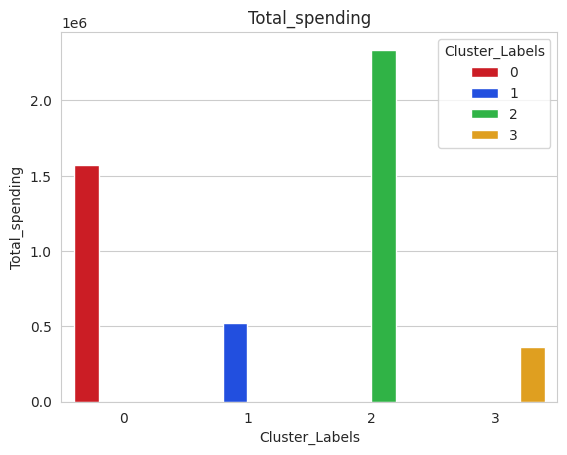

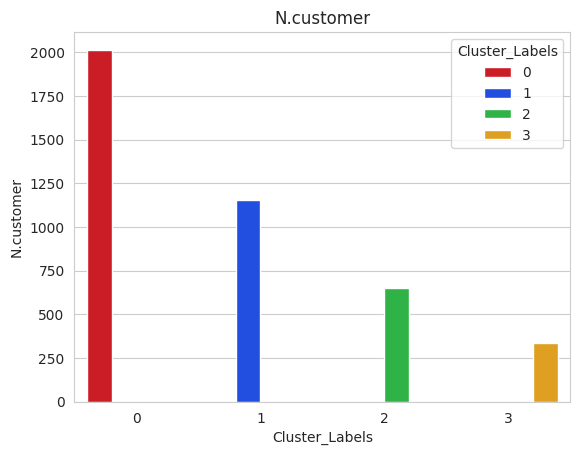

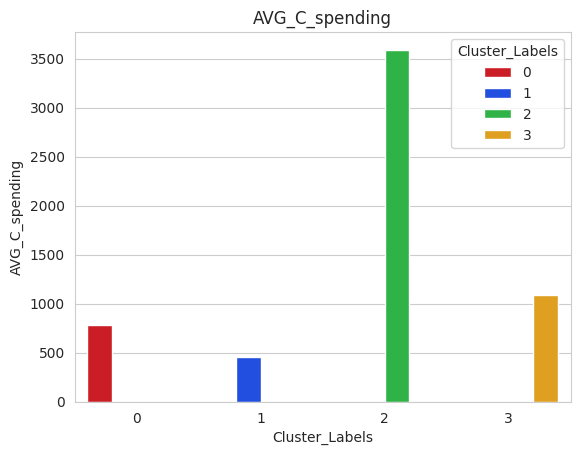

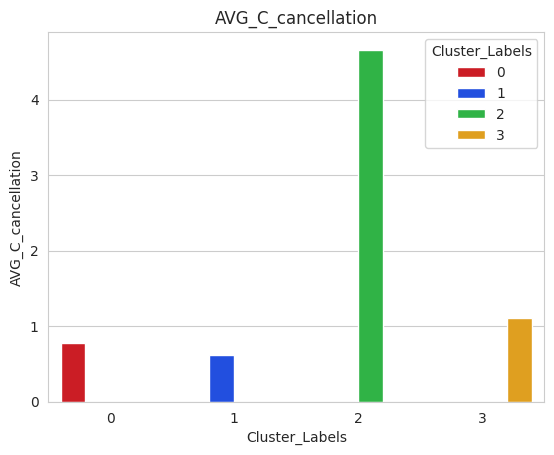

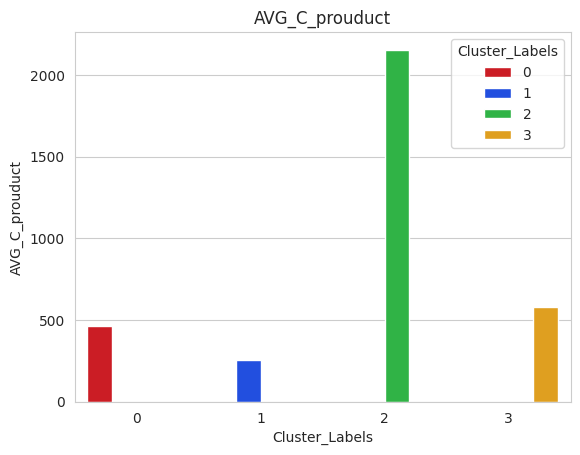

...

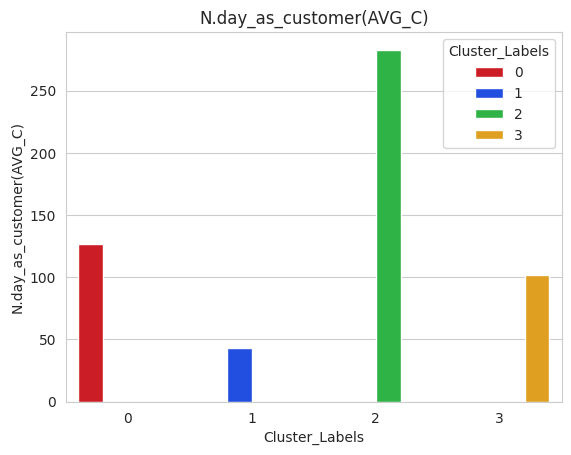

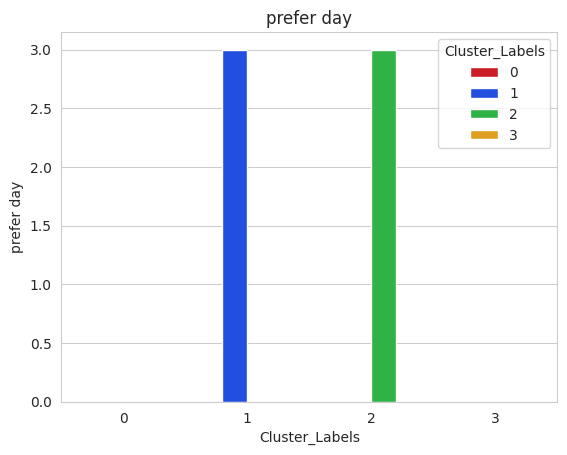

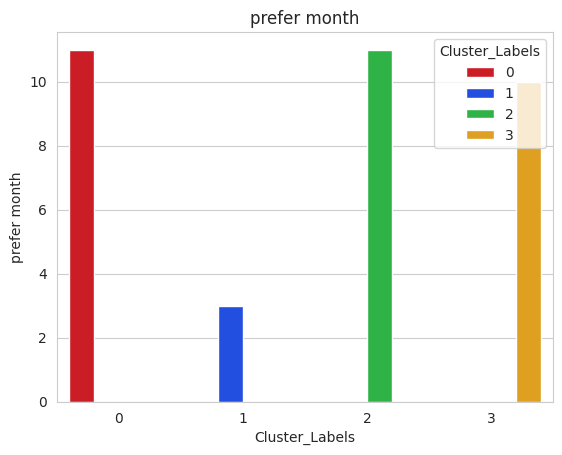

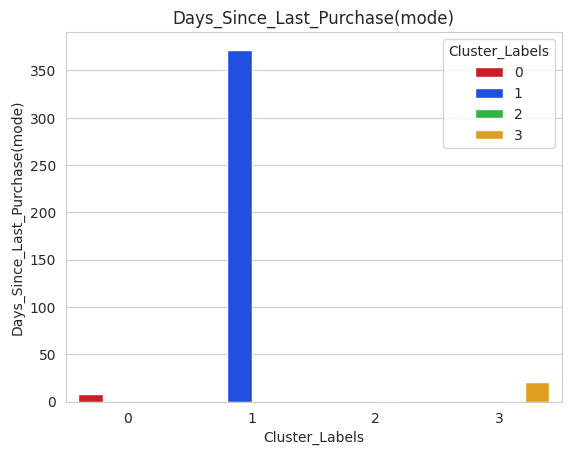

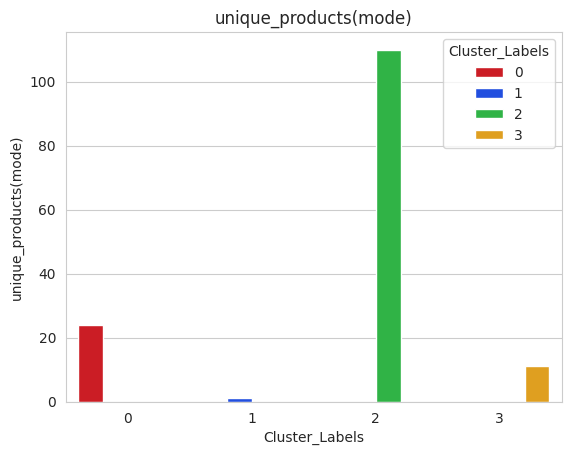

In [ ]:

for i ,x in enumerate( cluster_profiling.columns[1:] ):

    plt.title(x)
    sns.barplot(x='Cluster_Labels',y=x,hue='Cluster_Labels',data=cluster_profiling,palette=colors)
    plt.show()

In [ ]:
customer_behavior_scaled = pd.DataFrame(customer_behavior_scaled, columns=[f'{c}' for c in customer_behavior.columns[2:]])
customer_behavior_scaled['Cluster_Labels']=customer_behavior['Cluster_Labels'].values

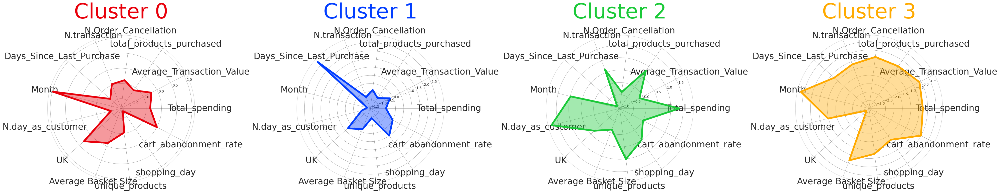

In [ ]:



continuous_result = customer_behavior_scaled.groupby('Cluster_Labels', as_index=False).median()[continuous_f]

# Grouping for discrete features
discrete_result = customer_behavior_scaled.groupby('Cluster_Labels', as_index=False).agg(lambda x: x.mode().iloc[0])[discrete_f]

# Merge the two dataframes on the 'Cluster_Labels'
#merged_result = pd.merge(continuous_result, discrete_result, how='right')

clusters_info = pd.concat([continuous_result, discrete_result], axis=1, sort=False)
clusters_info
cluster_centroids = clusters_info#customer_behavior_scaled.groupby('Cluster_Labels').median()
# Function to create a radar chart

num_clusters=km.n_clusters
def create_radar_chart(ax, angles, data, color, cluster):
    # Plot the data and fill the area
    ax.fill(angles, data, color=color, alpha=0.4)
    ax.plot(angles, data, color=color, linewidth=5, linestyle='solid')

    # Add a title
    ax.set_title(f'Cluster {cluster}', size=60, color=color, y=1.1)

# Set data
labels=np.array(cluster_centroids.columns)
num_vars = len(labels)

# Compute angle of each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# The plot is circular, so we need to "complete the loop" and append the start to the end
labels = np.concatenate((labels, [labels[0]]))
angles += angles[:1]

# Initialize the figure
fig, ax = plt.subplots(figsize=(40, 20), subplot_kw=dict(polar=True), nrows=1, ncols=4)



# Create radar chart for each cluster
colors = colors = ['#e8000b', '#023eff','#1ac938', '#ffaa00']# '#ff55aa', '#0088ff', '#44cc00']

#['#e8000b', '#023eff','#1ac938', '#023eff']
for i, color in enumerate(colors[:num_clusters]):
    data = cluster_centroids.loc[i].tolist()
    data += data[:1]  # Complete the loop
    create_radar_chart(ax[i], angles, data, color, i)

# Add input data

for i in range(num_clusters):
    ax[i].set_xticks(angles[:-1])
    ax[i].set_xticklabels(labels[:-1], size=25)

    # Add a grid
    ax[i].grid(color='grey', linewidth=0.5)

# Display the plot
plt.tight_layout()
plt.show()

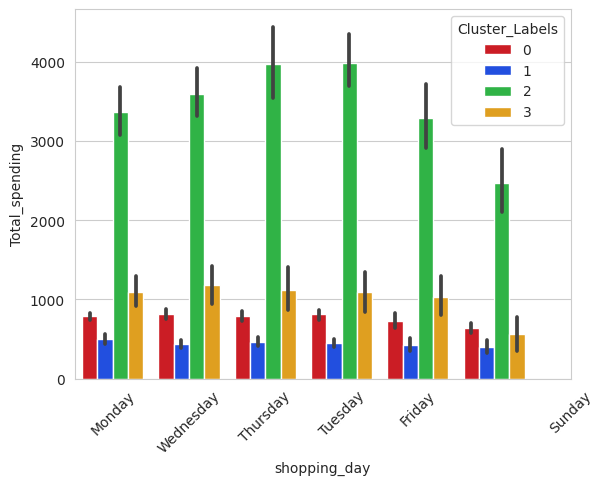

In [ ]:

#sns.set(style='whitegrid')
sns .barplot(x='shopping_day',y='Total_spending',hue='Cluster_Labels',data=customer_behavior,palette=colors)

plt.xticks(shopping_day_counts.index, custom_labels, rotation=45)
plt.show()

Max of Total_spending= 280206.02


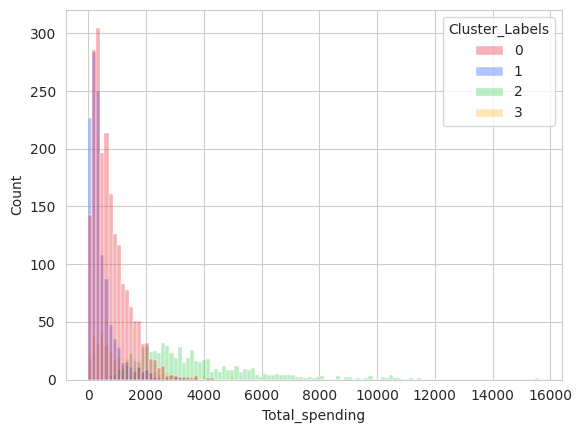

Max of total_products_purchased= 197491.0


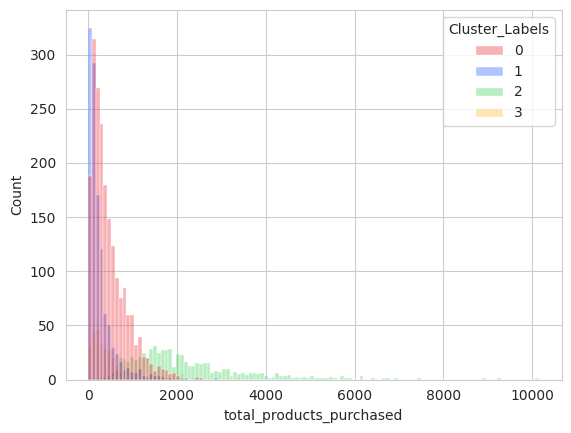

Max of N.Order_Cancellation= 226.0


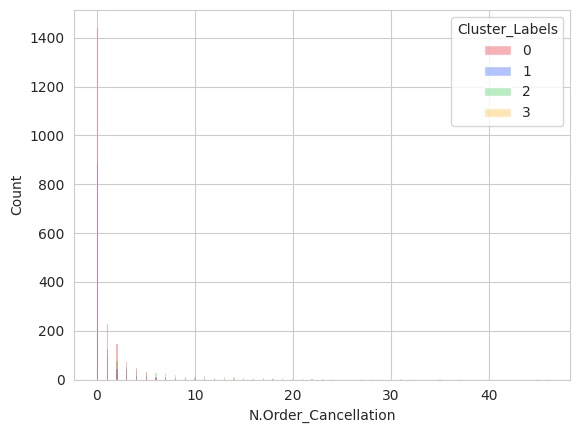

Max of N.transaction= 7847.0


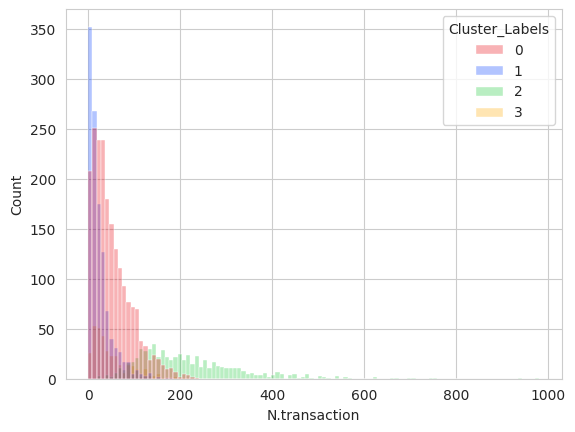

Max of Days_Since_Last_Purchase= 373.0


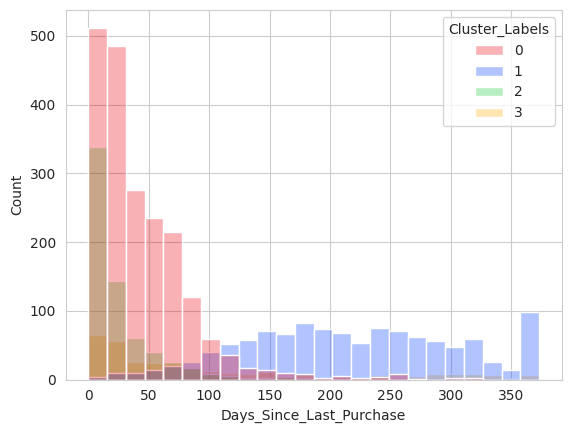

Max of Month= 12.0


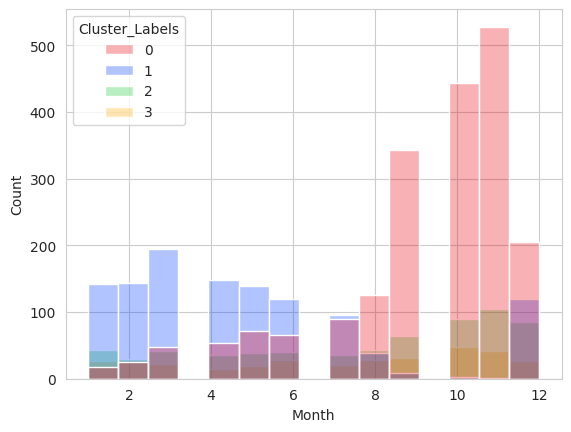

Max of N.day_as_customer= 373.0


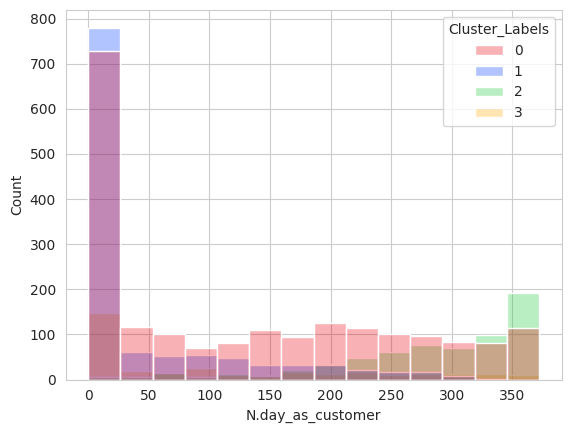

Max of UK= 1.0


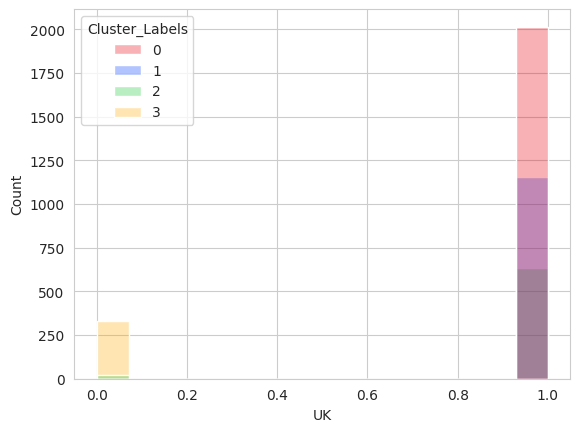

Max of Average Basket Size= 37107.0


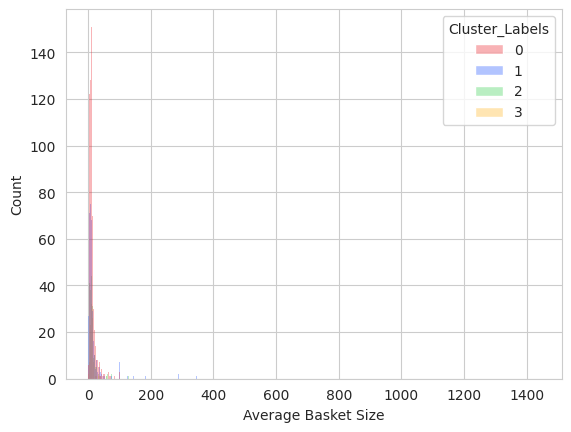

Max of Average_Transaction_Value= 42118.125


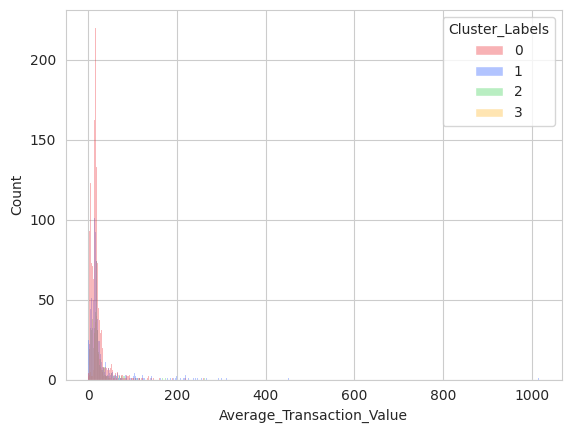

Max of unique_products= 1794.0


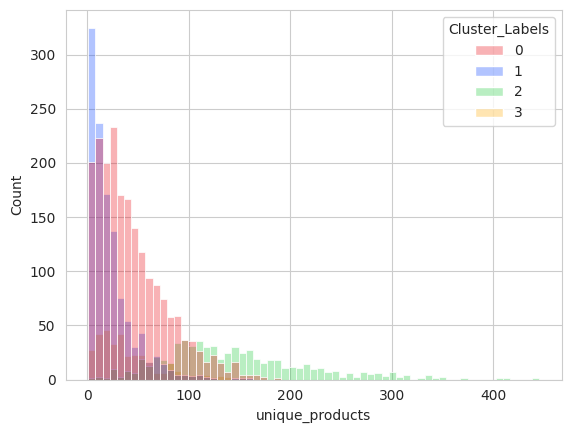

Max of shopping_day= 6.0


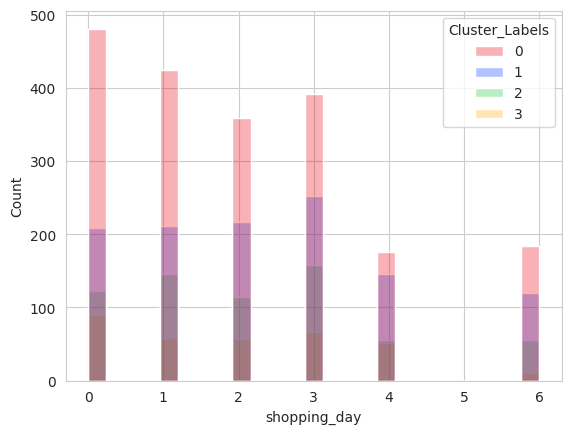

Max of cart_abandonment_rate= 0.0


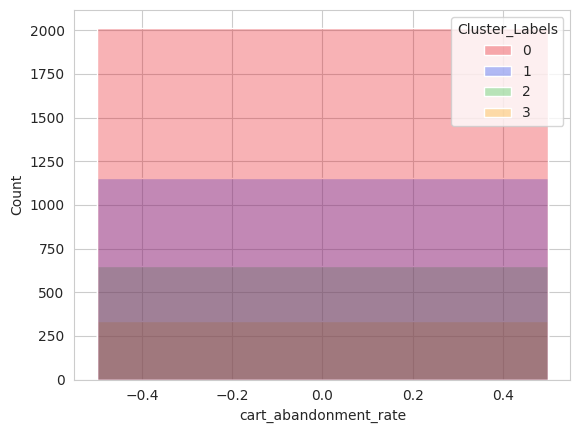

In [ ]:
import matplotlib.pyplot as plt
#sns.set(style='darkgrid')
for i in customer_behavior.columns[2:-1]:#[ 'Total_spending', 'order_frequency', 'Average Basket Size','total_products_purchased']:

    sns.histplot(x=i,hue='Cluster_Labels',alpha=.3,data=customer_behavior,palette=colors)#range=(0,desc.loc['75%',i])) #1661 is 3d quantire

    plt.xlabel(i)
    print(f'Max of {i}=',desc.loc['max',i])
    plt.show()

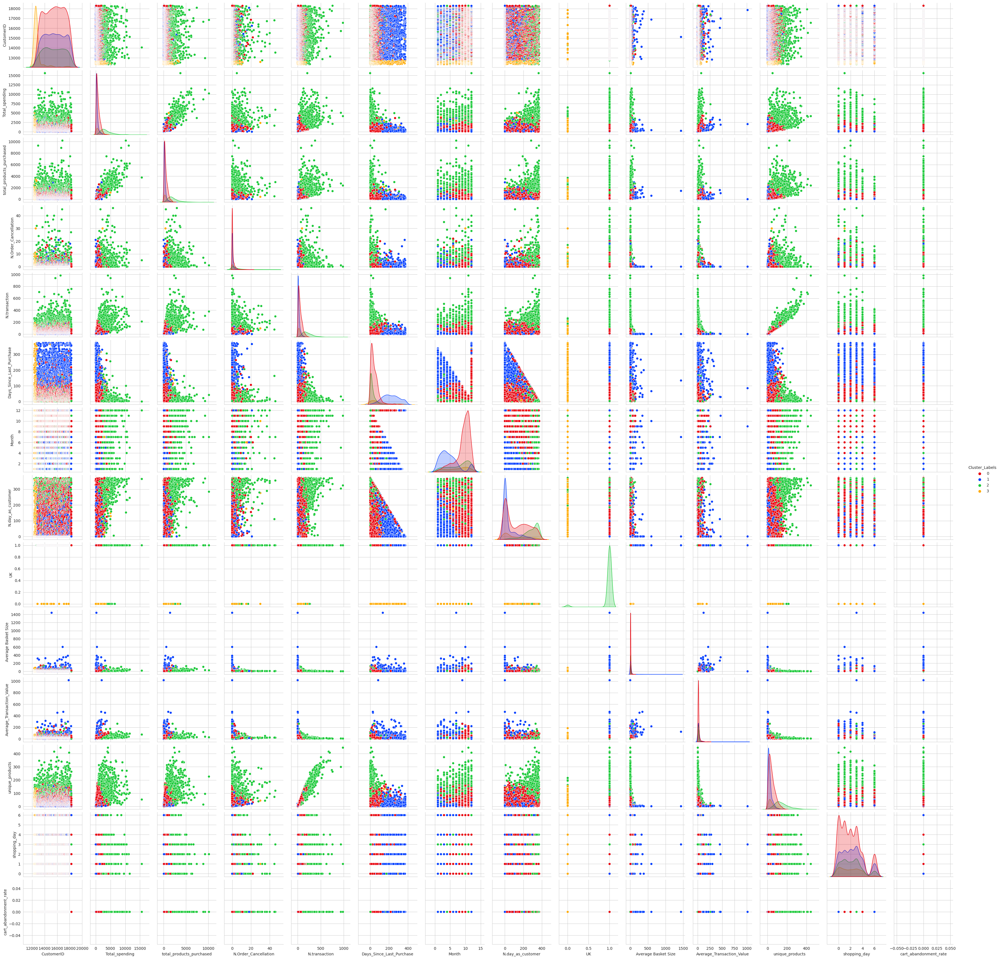

In [ ]:
sns.pairplot(customer_behavior,hue='Cluster_Labels',palette=colors)
plt.show()

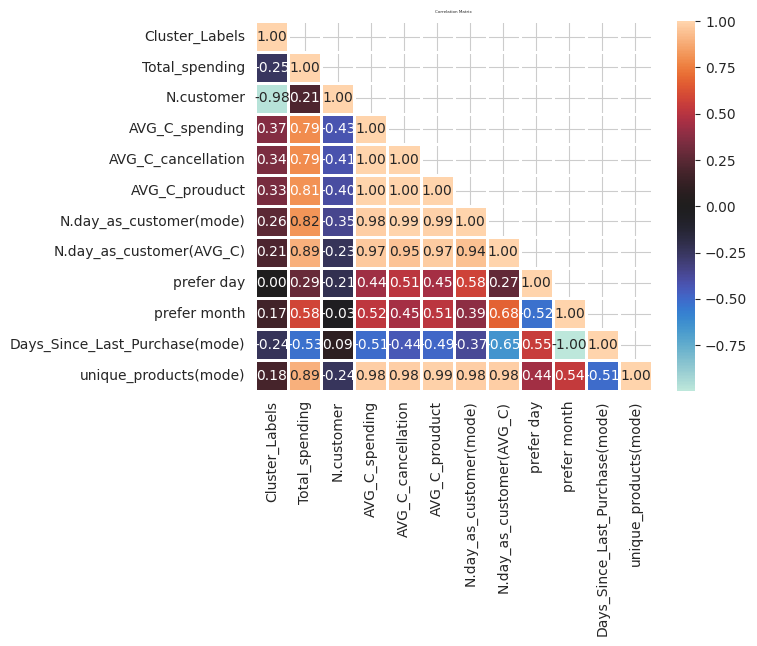

In [ ]:

#customer_behavior.corr().style.background_gradient(cmap='coolwarm')


sns.set_style('whitegrid')
corr=cluster_profiling.corr()

mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask, k=1)] = True
sns.heatmap(corr,mask=mask,annot=True,center=0, fmt='.2f', linewidths=2)
plt.title('Correlation Matrix', fontsize=3)
plt.show()

***
# 8-Personalization and Recommendations



***
#Cluster 0: Low Spending, Moderate Product Purchase
- Promotions: Offer discounts or promotions to incentivize increased spending, especially on products they have shown an interest in.Product Suggestions: Recommend products related to their previous purchases to encourage cross-selling.
- Communication: Use email marketing to inform them about special offers and new product arrivals.
***
#Cluster 1: Very Low Spending, Low Activity
- Reactivation Campaign: Launch a reactivation campaign targeting customers with a 372-day gap since their last purchase to bring them back to the market.
- Product Focus: Highlight the single product category they are interested in to encourage repeat purchases.
- Personalized Discounts: Provide exclusive discounts to this segment to boost their engagement.
***
#Cluster 2: High Spending, Loyal Customers
- VIP Treatment: Recognize their loyalty with VIP status, offering early access to sales or exclusive products.
- Personalized Recommendations: Utilize data on their wide range of product purchases to provide highly personalized product recommendations.
- Loyalty Programs: Introduce loyalty programs to reward them for their continuous engagement.
***
#Cluster 3: High Spending, Active, and Loyal
- Exclusive Offers: Provide exclusive offers to further reward their loyalty and encourage them to continue purchasing.
- Premium Services: Consider offering premium customer services like dedicated support or early access to new releases.
- Feedback Channels: Engage with them through surveys or feedback channels to gather insights for further improvements.

***
#Implications for the E-commerce Business:
- Targeted Marketing: Tailor marketing efforts to the specific needs and behaviors of each cluster. This enhances the efficiency of marketing campaigns and maximizes ROI.
- Customer Retention: Recognize the importance of retaining high-value, loyal customers (Clusters 2 and 3) and invest in strategies to keep them engaged. Reactivation efforts are crucial for customers at risk of churning (Cluster 1).
- Inventory Management: Use insights from customer segments to optimize inventory. For example, stock products that are popular among Cluster 2 and 3 customers while considering the preferences of Cluster 0 customers for targeted promotions.